In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from imblearn.over_sampling import SMOTE
import seaborn as sns
import plotly.express as px
import sklearn.preprocessing
from sklearn.preprocessing import MinMaxScaler
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LogisticRegression
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier, AdaBoostClassifier
from sklearn.svm import SVC
from sklearn.neighbors import KNeighborsClassifier
from sklearn.naive_bayes import GaussianNB
from sklearn.ensemble import GradientBoostingClassifier
import sklearn.metrics as mt
from sklearn.metrics import accuracy_score, confusion_matrix, classification_report, roc_auc_score, roc_curve, auc, ConfusionMatrixDisplay, RocCurveDisplay
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import RandomizedSearchCV
from scipy.stats import randint
from lime.lime_tabular import LimeTabularExplainer
import random

In [2]:
df1 = pd.read_csv('Case_FPKMofDEGs_Subtype.csv')
df1.head()

,Case,HSPB6,PDK4,ABCB5,SLC4A1,TMEM132A,DLX6,SLC13A2,SCN4A,PAX6,...,CCDC195,EEF1AKMT4,AC026316.4,AC253536.7,AC012213.5,H3C2,H3C3,AC106741.1,NPBWR1,Subtype
0,016caf42-4e19-4444-ab5d-6cf1e76c4afa,0.2774,5.4877,0.0000,0.0576,6.8253,1.0778,0.0218,0.1638,0.0211,...,0.0,13.0834,0.0000,0.0,0.0000,0.2202,0.2315,0.0,0.0033,bl1
1,05506f4c-e701-4a9d-ae06-97f066aade43,0.1145,0.6454,0.0015,0.0055,15.8840,1.0151,0.5376,0.0376,0.0588,...,0.0,14.0427,0.0091,0.0,0.0000,0.4691,0.2321,0.0,0.0201,bl1
2,124b693c-77dc-4fa8-b703-54e8b5054a92,0.1699,2.3810,0.0056,0.0034,35.7974,7.3965,0.0107,0.1442,0.4591,...,0.0,12.0511,0.0000,0.0,0.0000,0.3034,0.1063,0.0,0.0409,bl1
3,1d27253f-b036-44e7-a04d-8da5bbf57419,0.1188,0.0902,0.0000,0.0114,55.3488,6.2779,0.0000,0.0071,0.1205,...,0.0,23.4425,0.0000,0.0,0.0000,0.1718,0.4817,0.0,0.0000,bl1
4,23c31c2e-336c-4878-a476-cf8d811b4875,0.2008,0.9476,0.0771,0.0000,14.2182,1.6706,0.2884,0.0394,0.0073,...,0.0,12.4938,0.0000,0.0,0.0075,0.2117,0.0000,0.0,0.0154,bl1


In [3]:
df1.shape

(459, 963)

In [4]:
cancer_type_counts = df1['Subtype'].value_counts()
cancer_type_counts

Subtype
nonTNBC    292
bl1         57
m           40
lar         36
bl2         34
Name: count, dtype: int64

In [5]:
df1.dtypes

Case           object
HSPB6         float64
PDK4          float64
ABCB5         float64
SLC4A1        float64
               ...   
H3C2          float64
H3C3          float64
AC106741.1    float64
NPBWR1        float64
Subtype        object
Length: 963, dtype: object

In [6]:
df1.describe().T

,count,mean,std,min,25%,50%,75%,max
HSPB6,459.0,2.681547,13.512876,0.0000,0.23495,0.5469,1.57585,252.8644
PDK4,459.0,16.218777,43.675160,0.0902,2.13435,5.1439,14.60040,603.7958
ABCB5,459.0,0.073796,0.210896,0.0000,0.00495,0.0158,0.05270,2.8010
SLC4A1,459.0,0.012975,0.058373,0.0000,0.00000,0.0055,0.01105,1.1740
TMEM132A,459.0,15.858388,13.603029,0.3129,6.67700,11.7058,19.95665,107.5059
...,...,...,...,...,...,...,...,...
AC012213.5,459.0,0.001036,0.003688,0.0000,0.00000,0.0000,0.00000,0.0401
H3C2,459.0,3.114304,37.866774,0.0000,0.07075,0.2158,0.64625,793.9916
H3C3,459.0,0.787218,4.771651,0.0000,0.05260,0.1524,0.44735,82.0140
AC106741.1,459.0,0.000353,0.001765,0.0000,0.00000,0.0000,0.00000,0.0181


In [7]:
print(df1.isna().sum())

Case          0
HSPB6         0
PDK4          0
ABCB5         0
SLC4A1        0
             ..
H3C2          0
H3C3          0
AC106741.1    0
NPBWR1        0
Subtype       0
Length: 963, dtype: int64


In [8]:
df1.duplicated().sum()

0

In [10]:
# Subsetting dataframe

X = df1.drop(columns=['Case','Subtype'])
y = df1['Subtype'].values

In [11]:
X

,HSPB6,PDK4,ABCB5,SLC4A1,TMEM132A,DLX6,SLC13A2,SCN4A,PAX6,E2F2,...,CCDC201,CCDC195,EEF1AKMT4,AC026316.4,AC253536.7,AC012213.5,H3C2,H3C3,AC106741.1,NPBWR1
0,0.2774,5.4877,0.0000,0.0576,6.8253,1.0778,0.0218,0.1638,0.0211,4.4315,...,0.0000,0.0,13.0834,0.0000,0.0000,0.0000,0.2202,0.2315,0.0,0.0033
1,0.1145,0.6454,0.0015,0.0055,15.8840,1.0151,0.5376,0.0376,0.0588,8.3411,...,0.0038,0.0,14.0427,0.0091,0.0000,0.0000,0.4691,0.2321,0.0,0.0201
2,0.1699,2.3810,0.0056,0.0034,35.7974,7.3965,0.0107,0.1442,0.4591,3.1258,...,0.0000,0.0,12.0511,0.0000,0.0000,0.0000,0.3034,0.1063,0.0,0.0409
3,0.1188,0.0902,0.0000,0.0114,55.3488,6.2779,0.0000,0.0071,0.1205,2.5826,...,0.0000,0.0,23.4425,0.0000,0.0000,0.0000,0.1718,0.4817,0.0,0.0000
4,0.2008,0.9476,0.0771,0.0000,14.2182,1.6706,0.2884,0.0394,0.0073,8.7783,...,0.0058,0.0,12.4938,0.0000,0.0000,0.0075,0.2117,0.0000,0.0,0.0154
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
454,0.3020,5.4132,0.0109,0.0056,8.3992,0.0042,0.6858,0.0316,0.0084,2.3324,...,0.0078,0.0,4.6867,0.0000,0.0180,0.0000,0.0283,0.2380,0.0,0.0000
455,1.1831,12.8316,0.0378,0.0080,6.8715,0.0718,33.0250,0.8723,0.0010,1.0298,...,0.8506,0.0,2.5146,0.0133,0.0000,0.0000,0.0403,0.0000,0.0,0.0000
456,2.9660,18.1087,0.1066,0.0000,8.9352,0.0391,0.3476,0.3619,0.0022,0.4886,...,0.0000,0.0,5.8886,0.0000,0.0000,0.0000,0.3511,0.0923,0.0,0.0053
457,1.7875,15.2465,0.1127,0.0062,6.0918,0.0046,2.0084,0.3048,0.0008,0.9663,...,0.0000,0.0,1.5236,0.0102,0.0000,0.0000,0.0000,0.0975,0.0,0.0075


In [12]:
#Scaling (Normalization)

scaler = MinMaxScaler()

X_scaled = scaler.fit_transform(X)
X_scaled = pd.DataFrame(X_scaled, columns=X.columns)
X_scaled.head()

,HSPB6,PDK4,ABCB5,SLC4A1,TMEM132A,DLX6,SLC13A2,SCN4A,PAX6,E2F2,...,CCDC201,CCDC195,EEF1AKMT4,AC026316.4,AC253536.7,AC012213.5,H3C2,H3C3,AC106741.1,NPBWR1
0,0.001097,0.008941,0.000000,0.049063,0.060754,0.145718,0.000387,0.004549,0.004670,0.069220,...,0.000000,0.0,0.247349,0.000000,0.0,0.000000,0.000277,0.002823,0.0,0.000886
1,0.000453,0.000920,0.000536,0.004685,0.145262,0.137241,0.009545,0.000999,0.013013,0.130482,...,0.004467,0.0,0.265970,0.086998,0.0,0.000000,0.000591,0.002830,0.0,0.005397
2,0.000672,0.003795,0.001999,0.002896,0.331034,1.000000,0.000190,0.003998,0.101607,0.048761,...,0.000000,0.0,0.227310,0.000000,0.0,0.000000,0.000382,0.001296,0.0,0.010982
3,0.000470,0.000000,0.000000,0.009710,0.513428,0.848766,0.000000,0.000141,0.026669,0.040249,...,0.000000,0.0,0.448434,0.000000,0.0,0.000000,0.000216,0.005873,0.0,0.000000
4,0.000794,0.001420,0.027526,0.000000,0.129722,0.225864,0.005120,0.001049,0.001616,0.137333,...,0.006819,0.0,0.235904,0.000000,0.0,0.187032,0.000267,0.000000,0.0,0.004135


In [13]:
X_scaled.describe()

,HSPB6,PDK4,ABCB5,SLC4A1,TMEM132A,DLX6,SLC13A2,SCN4A,PAX6,E2F2,...,CCDC201,CCDC195,EEF1AKMT4,AC026316.4,AC253536.7,AC012213.5,H3C2,H3C3,AC106741.1,NPBWR1
count,459.000000,459.000000,459.000000,459.000000,459.000000,459.000000,459.000000,459.000000,459.000000,459.000000,...,459.000000,459.00000,459.000000,459.000000,459.000000,459.000000,459.000000,459.000000,459.000000,459.000000
mean,0.010605,0.026716,0.026346,0.011052,0.145023,0.047753,0.032228,0.012359,0.022724,0.043640,...,0.016163,0.03072,0.138799,0.023669,0.042696,0.025840,0.003922,0.009599,0.019487,0.015123
std,0.053439,0.072345,0.075293,0.049721,0.126902,0.127794,0.092200,0.064498,0.079365,0.065063,...,0.066720,0.08998,0.143292,0.095708,0.129333,0.091964,0.047692,0.058181,0.097518,0.062275
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.00000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,0.000929,0.003386,0.001767,0.000000,0.059370,0.000973,0.000912,0.001705,0.000509,0.014852,...,0.000000,0.00000,0.049352,0.000000,0.000000,0.000000,0.000089,0.000641,0.000000,0.000000
50%,0.002163,0.008371,0.005641,0.004685,0.106284,0.002596,0.005362,0.003956,0.001461,0.027723,...,0.000000,0.00000,0.090285,0.000000,0.000000,0.000000,0.000272,0.001858,0.000000,0.002417
75%,0.006232,0.024035,0.018815,0.009412,0.183256,0.009498,0.021750,0.009470,0.007259,0.050789,...,0.009464,0.00000,0.174400,0.000000,0.000000,0.000000,0.000814,0.005455,0.000000,0.007867
max,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,...,1.000000,1.00000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000


# **SMOTE**

In [14]:
smote = SMOTE(sampling_strategy={'bl1':200, 'm':200, 'lar':200, 'bl2':200})
X_smote, y_smote = smote.fit_resample(X_scaled, y)

In [530]:
X_smote.shape

(1092, 961)

In [531]:
(y_smote=='bl1').sum()

200

In [532]:
(y_smote=='nonTNBC').sum()

292

# **Train Test Split**

In [15]:
X_train, X_test, y_train, y_test = train_test_split(X_smote, y_smote, test_size=0.2, random_state=42)

# check the size
print(X_train.shape)
print(X_test.shape)
print(y_train.shape)
print(y_test.shape)

(873, 961)
(219, 961)
(873,)
(219,)


In [16]:
(y_train=='bl1').sum()

155

In [17]:
(y_train=='m').sum()

166

In [18]:
(y_train=='lar').sum()

171

In [19]:
(y_train=='bl2').sum()

156

In [529]:
(y_train=='nonTNBC').sum()

225

## Comparing Different Models for Classification

In [20]:
# Models to evaluate

models = {
    "Logistic Regression": LogisticRegression(max_iter=1000),
    "Decision Tree": DecisionTreeClassifier(),
    "Random Forest": RandomForestClassifier(),
    "AdaBoost": AdaBoostClassifier(),
    "Gradient Boosting": GradientBoostingClassifier(),
    "SVM": SVC(probability=True),
    "K-Nearest Neighbors": KNeighborsClassifier(),
    "Gaussian Naive Bayes": GaussianNB()
}


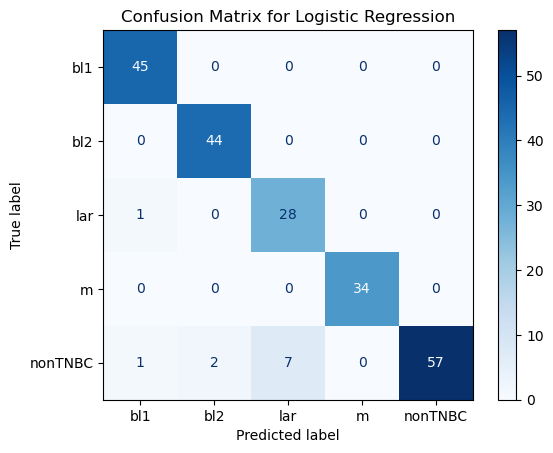

Classification Report for Logistic Regression:
              precision    recall  f1-score   support

         bl1       0.96      1.00      0.98        45
         bl2       0.96      1.00      0.98        44
         lar       0.80      0.97      0.88        29
           m       1.00      1.00      1.00        34
     nonTNBC       1.00      0.85      0.92        67

    accuracy                           0.95       219
   macro avg       0.94      0.96      0.95       219
weighted avg       0.96      0.95      0.95       219




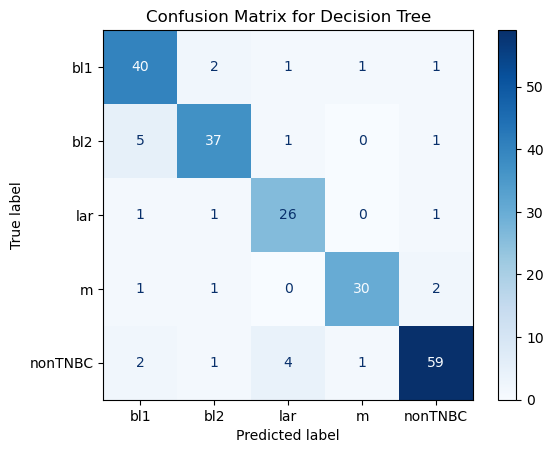

Classification Report for Decision Tree:
              precision    recall  f1-score   support

         bl1       0.82      0.89      0.85        45
         bl2       0.88      0.84      0.86        44
         lar       0.81      0.90      0.85        29
           m       0.94      0.88      0.91        34
     nonTNBC       0.92      0.88      0.90        67

    accuracy                           0.88       219
   macro avg       0.87      0.88      0.87       219
weighted avg       0.88      0.88      0.88       219




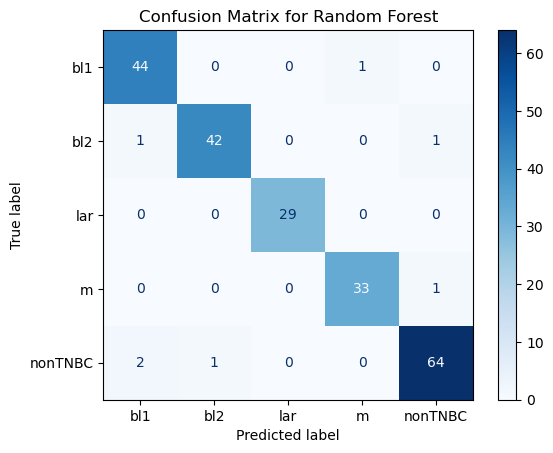

Classification Report for Random Forest:
              precision    recall  f1-score   support

         bl1       0.94      0.98      0.96        45
         bl2       0.98      0.95      0.97        44
         lar       1.00      1.00      1.00        29
           m       0.97      0.97      0.97        34
     nonTNBC       0.97      0.96      0.96        67

    accuracy                           0.97       219
   macro avg       0.97      0.97      0.97       219
weighted avg       0.97      0.97      0.97       219




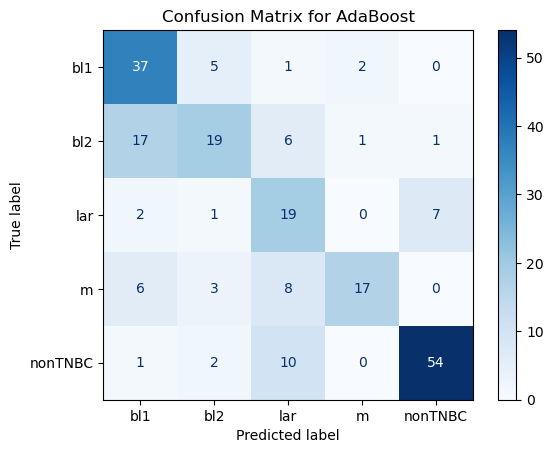

Classification Report for AdaBoost:
              precision    recall  f1-score   support

         bl1       0.59      0.82      0.69        45
         bl2       0.63      0.43      0.51        44
         lar       0.43      0.66      0.52        29
           m       0.85      0.50      0.63        34
     nonTNBC       0.87      0.81      0.84        67

    accuracy                           0.67       219
   macro avg       0.67      0.64      0.64       219
weighted avg       0.70      0.67      0.67       219




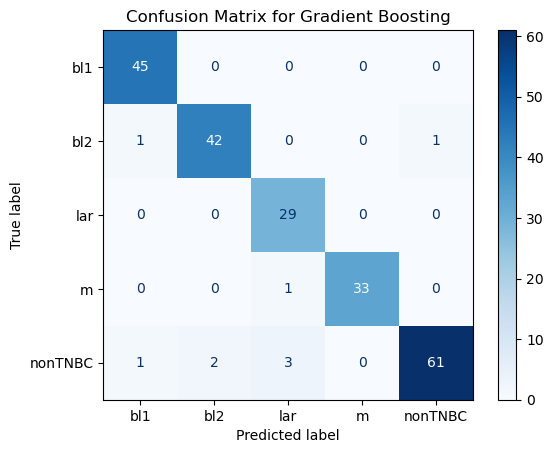

Classification Report for Gradient Boosting:
              precision    recall  f1-score   support

         bl1       0.96      1.00      0.98        45
         bl2       0.95      0.95      0.95        44
         lar       0.88      1.00      0.94        29
           m       1.00      0.97      0.99        34
     nonTNBC       0.98      0.91      0.95        67

    accuracy                           0.96       219
   macro avg       0.95      0.97      0.96       219
weighted avg       0.96      0.96      0.96       219




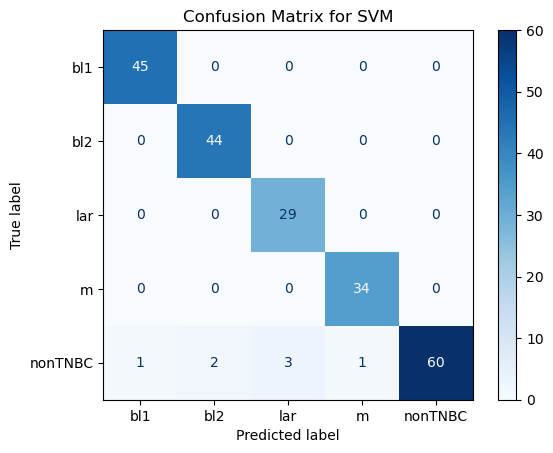

Classification Report for SVM:
              precision    recall  f1-score   support

         bl1       0.98      1.00      0.99        45
         bl2       0.96      1.00      0.98        44
         lar       0.91      1.00      0.95        29
           m       0.97      1.00      0.99        34
     nonTNBC       1.00      0.90      0.94        67

    accuracy                           0.97       219
   macro avg       0.96      0.98      0.97       219
weighted avg       0.97      0.97      0.97       219




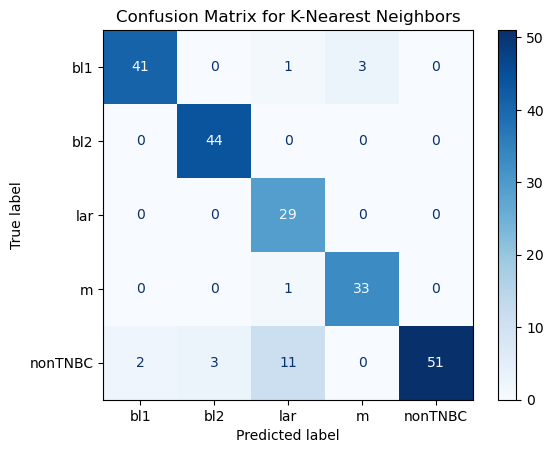

Classification Report for K-Nearest Neighbors:
              precision    recall  f1-score   support

         bl1       0.95      0.91      0.93        45
         bl2       0.94      1.00      0.97        44
         lar       0.69      1.00      0.82        29
           m       0.92      0.97      0.94        34
     nonTNBC       1.00      0.76      0.86        67

    accuracy                           0.90       219
   macro avg       0.90      0.93      0.90       219
weighted avg       0.92      0.90      0.90       219




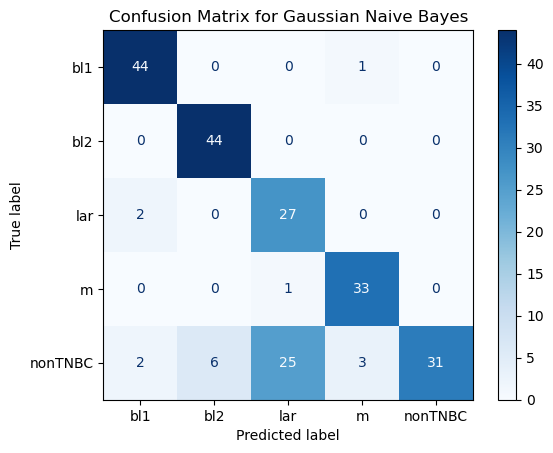

Classification Report for Gaussian Naive Bayes:
              precision    recall  f1-score   support

         bl1       0.92      0.98      0.95        45
         bl2       0.88      1.00      0.94        44
         lar       0.51      0.93      0.66        29
           m       0.89      0.97      0.93        34
     nonTNBC       1.00      0.46      0.63        67

    accuracy                           0.82       219
   macro avg       0.84      0.87      0.82       219
weighted avg       0.88      0.82      0.81       219




In [21]:
results = {'Model': [], 'Train Accuracy': [], 'Test Accuracy': []}

# Train and evaluate models
for name, model in models.items():
    model.fit(X_train, y_train)
    y_train_pred = model.predict(X_train)
    y_test_pred = model.predict(X_test)
    train_accuracy = accuracy_score(y_train, y_train_pred)
    test_accuracy = accuracy_score(y_test, y_test_pred)

    results['Model'].append(name)
    results['Train Accuracy'].append(train_accuracy)
    results['Test Accuracy'].append(test_accuracy)


    # Plot confusion matrix
    cm = confusion_matrix(y_test, y_test_pred, labels=model.classes_)
    disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=model.classes_)
    disp.plot(cmap=plt.cm.Blues)
    plt.title(f"Confusion Matrix for {name}")
    plt.show()

    # Print classification report
    print(f"Classification Report for {name}:")
    print(classification_report(y_test, y_test_pred))
    print()


In [22]:
results_df = pd.DataFrame(results)
results_df = results_df.sort_values(by='Test Accuracy', ascending=False)
results_df

,Model,Train Accuracy,Test Accuracy
2,Random Forest,1.000000,0.968037
5,SVM,0.997709,0.968037
4,Gradient Boosting,1.000000,0.958904
0,Logistic Regression,1.000000,0.949772
6,K-Nearest Neighbors,0.933562,0.904110
1,Decision Tree,1.000000,0.876712
7,Gaussian Naive Bayes,0.876289,0.817352
3,AdaBoost,0.684994,0.666667


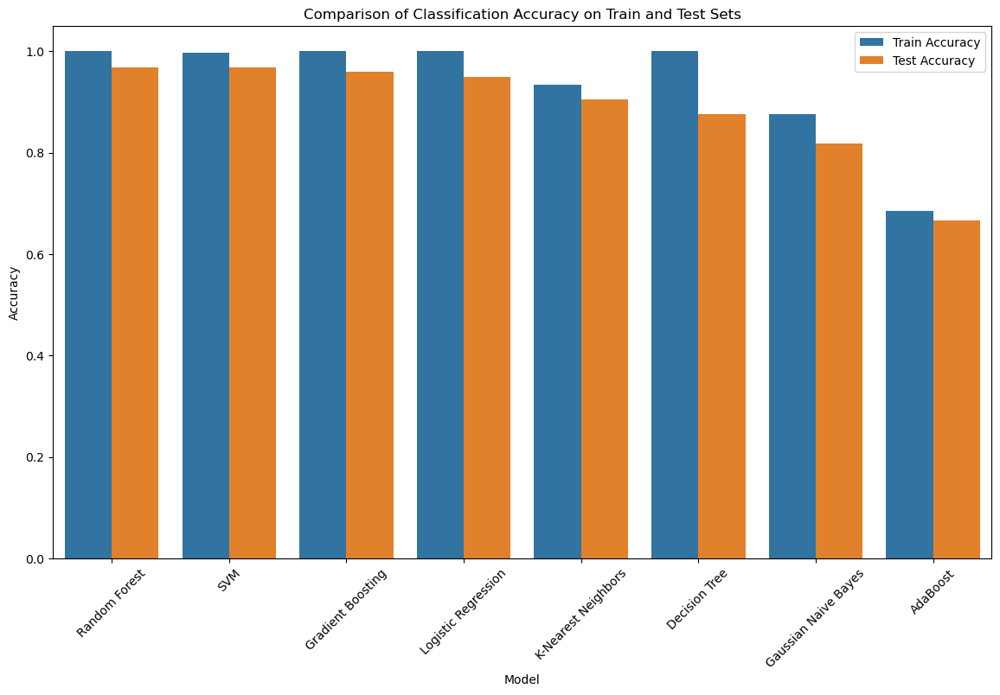

In [23]:
# Plot the comparison of train and test accuracy on a bar graph
results_df_melted = results_df.melt(id_vars='Model', var_name='Set', value_name='Accuracy')

plt.figure(figsize=(14, 8))
sns.barplot(x='Model', y='Accuracy', hue='Set', data=results_df_melted)
plt.xticks(rotation=45)
plt.title('Comparison of Classification Accuracy on Train and Test Sets')
plt.xlabel('Model')
plt.ylabel('Accuracy')
plt.legend(loc='best')
plt.show()

In [23]:
# Inference - Gradient Boosting is the best model according to test accuracy score

In [24]:
X_train

,HSPB6,PDK4,ABCB5,SLC4A1,TMEM132A,DLX6,SLC13A2,SCN4A,PAX6,E2F2,...,CCDC201,CCDC195,EEF1AKMT4,AC026316.4,AC253536.7,AC012213.5,H3C2,H3C3,AC106741.1,NPBWR1
6,0.003223,0.000763,0.000000,0.000000,0.124798,0.206206,0.000000,0.000400,0.033021,0.054997,...,0.000000,0.00000,0.552074,0.000000,0.000000,0.000000,0.001613,0.006760,0.000000,0.095776
977,0.000913,0.003437,0.009148,0.038430,0.376174,0.008537,0.034540,0.000778,0.001065,0.032954,...,0.000000,0.00000,0.325851,0.000000,0.044030,0.000000,0.000891,0.007451,0.000000,0.105107
773,0.001207,0.002410,0.001407,0.006279,0.110901,0.002572,0.007581,0.005894,0.001406,0.061799,...,0.023811,0.00000,0.166155,0.000000,0.000000,0.163945,0.001697,0.004702,0.381559,0.028903
853,0.002089,0.007201,0.011011,0.001116,0.165805,0.001879,0.003763,0.002261,0.001181,0.024698,...,0.000000,0.00000,0.200799,0.000000,0.000000,0.000000,0.000822,0.005512,0.000000,0.001495
660,0.001043,0.013324,0.010792,0.000562,0.227719,0.000403,0.028824,0.002478,0.017250,0.071987,...,0.000000,0.01591,0.235696,0.000000,0.087769,0.000000,0.001029,0.001562,0.000000,0.003071
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
330,0.001867,0.003015,0.008140,0.000000,0.052532,0.002961,0.035083,0.002051,0.007281,0.007043,...,0.019045,0.28044,0.022484,0.000000,0.000000,0.000000,0.000000,0.000756,0.000000,0.001933
466,0.001409,0.004855,0.002856,0.004805,0.141410,0.087449,0.001854,0.001478,0.032471,0.165048,...,0.001149,0.00565,0.135674,0.000000,0.000000,0.020893,0.000293,0.002934,0.000000,0.002461
121,0.002529,0.002088,0.000643,0.073850,0.073483,0.450024,0.006610,0.003365,0.104086,0.028666,...,0.031154,0.00000,0.282276,0.000000,0.000000,0.000000,0.000041,0.000825,0.000000,0.000000
1044,0.006695,0.018826,0.114378,0.002625,0.050198,0.046694,0.016378,0.004231,0.002913,0.080368,...,0.016649,0.00000,0.193855,0.000000,0.055451,0.094133,0.001136,0.008207,0.000000,0.032240


# **Cross Validation**

In [25]:
# Gradient Boosting Classifier

best_model_gbc = GradientBoostingClassifier()  # Replace with the best model
best_model_gbc.fit(X_train, y_train)
scores_gbc = cross_val_score(best_model_gbc, X_train, y_train, cv=10)
print(f'Cross-Validation Scores: {scores_gbc}')
print(f'Mean Cross-Validation Score: {np.mean(scores_gbc)}')


Cross-Validation Scores: [1.       0.953125 0.984375 0.96875  0.984375 0.984375 1.       0.984375
 0.96875  0.984375]
Mean Cross-Validation Score: 0.98125


# **Hyperparameter Tuning**

In [ ]:
from scipy.stats import uniform, randint

# Define the parameter distribution

param_dist = {
    'n_estimators': randint(100, 1000),
    'loss': ['log_loss', 'deviance'],
    'max_features': ['auto', 'sqrt', 'log2', None],
    'learning_rate': uniform(0.01, 0.2),
    'max_depth': randint(3, 10),
    'min_samples_split': randint(2, 20),
    'min_samples_leaf': randint(1, 20),
    'subsample': uniform(0.6, 0.4)
}

gbc = GradientBoostingClassifier()

random_search = RandomizedSearchCV(estimator = gbc, param_distributions = param_dist, n_iter = 100, scoring= 'accuracy', cv = 5, verbose = 2, random_state = 42, n_jobs = -1)

random_search.fit(X_train, y_train)

# Get the best parameters

best_params = random_search.best_params_
print(f'Best parameters found: {best_params}')

Fitting 5 folds for each of 100 candidates, totalling 500 fits


### After Hyperparameter tuning

In [25]:
# Initialize the Gradient Boosting Classifier with the best parameters
best_gbc = GradientBoostingClassifier(loss= 'log_loss', learning_rate = 0.0934822006297558, max_depth = 3, min_samples_leaf = 10, min_samples_split = 13, n_estimators = 263, subsample = 0.9771638815650077)

best_gbc.fit(X_train, y_train)

y_test_pred1 = best_gbc.predict(X_test)

# Also including some manual hyperparameter tuning

In [26]:
# Calculate accuracy
test_accuracy1 = accuracy_score(y_test, y_test_pred1)
print(f'Test Accuracy: {test_accuracy1}')

Test Accuracy: 0.9680365296803652


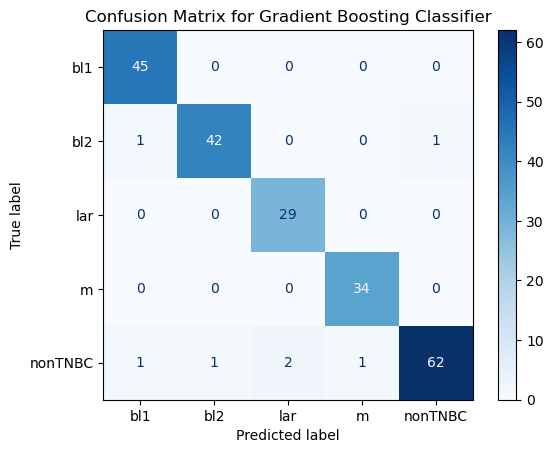

Classification Report:
              precision    recall  f1-score   support

         bl1       0.96      1.00      0.98        45
         bl2       0.98      0.95      0.97        44
         lar       0.94      1.00      0.97        29
           m       0.97      1.00      0.99        34
     nonTNBC       0.98      0.93      0.95        67

    accuracy                           0.97       219
   macro avg       0.97      0.98      0.97       219
weighted avg       0.97      0.97      0.97       219



In [27]:
# Confusion matrix
cm_gbc = confusion_matrix(y_test, y_test_pred1)
disp1 = ConfusionMatrixDisplay(confusion_matrix = cm_gbc, display_labels = best_gbc.classes_)
disp1.plot(cmap=plt.cm.Blues)
plt.title('Confusion Matrix for Gradient Boosting Classifier')
plt.show()

# Classification report
class_report1 = classification_report(y_test, y_test_pred1)
print('Classification Report:')
print(class_report1)

In [ ]:
# Inference - test accuracy increases from 0.915789 to 0.936842 after hyperparameter tuning
# No. of false positives also decreased

# **LIME with RF Calssifier**

In [91]:
pip install lime

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 275.7/275.7 kB 2.0 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
  Created wheel for lime: filename=lime-0.2.0.1-py3-none-any.whl size=283835 sha256=33ddc94cb6eeb319f3c261e39e2c4e7f327924d4cf0c10d27bc2960f2c61f5fd
  Stored in directory: /root/.cache/pip/wheels/fd/a2/af/9ac0a1a85a27f314a06b39e1f492bee1547d52549a4606ed89
Successfully built lime


In [159]:
# Initialize LIME Explainer
explainer = LimeTabularExplainer( training_data=X_train.values, feature_names=X_train.columns[:], class_names=model.classes_, mode = 'classification',)


In [74]:
model.classes_

array(['bl1', 'bl2', 'lar', 'm', 'nonTNBC'], dtype='<U7')

In [30]:
best_gbc.classes_

array(['bl1', 'bl2', 'lar', 'm', 'nonTNBC'], dtype=object)

In [75]:
X_test.values

array([[0.00031702, 0.00153135, 0.00053271, ..., 0.00801212, 0.        ,
        0.00163277],
       [0.0011868 , 0.00155324, 0.00571225, ..., 0.00074134, 0.14917127,
        0.01321054],
       [0.00115596, 0.00170017, 0.        , ..., 0.00915453, 0.        ,
        0.00886073],
       ...,
       [0.00226287, 0.00635012, 0.00203499, ..., 0.00026337, 0.        ,
        0.03815482],
       [0.00159699, 0.00550988, 0.00889515, ..., 0.0038013 , 0.        ,
        0.00843894],
       [0.0006719 , 0.00379456, 0.00199929, ..., 0.00129612, 0.        ,
        0.01098193]])

In [76]:
y_test

array(['bl1', 'lar', 'bl2', 'lar', 'bl2', 'lar', 'nonTNBC', 'nonTNBC',
       'm', 'lar', 'lar', 'lar', 'lar', 'bl1', 'bl1', 'm', 'nonTNBC',
       'bl1', 'bl2', 'bl2', 'bl1', 'nonTNBC', 'lar', 'bl2', 'nonTNBC',
       'bl2', 'nonTNBC', 'nonTNBC', 'm', 'bl2', 'nonTNBC', 'bl2', 'lar',
       'bl1', 'nonTNBC', 'm', 'lar', 'bl2', 'nonTNBC', 'm', 'bl1', 'm',
       'm', 'lar', 'bl2', 'nonTNBC', 'lar', 'bl1', 'nonTNBC', 'm', 'bl2',
       'nonTNBC', 'nonTNBC', 'lar', 'lar', 'bl1', 'm', 'bl2', 'bl1',
       'bl2', 'nonTNBC', 'bl1', 'm', 'lar', 'nonTNBC', 'm', 'bl1', 'bl1',
       'nonTNBC', 'nonTNBC', 'nonTNBC', 'm', 'm', 'bl2', 'lar', 'bl2',
       'nonTNBC', 'lar', 'nonTNBC', 'm', 'lar', 'nonTNBC', 'nonTNBC',
       'bl1', 'bl1', 'nonTNBC', 'bl1', 'bl2', 'bl2', 'bl2', 'nonTNBC',
       'm', 'bl2', 'nonTNBC', 'nonTNBC', 'm', 'm', 'lar', 'nonTNBC',
       'nonTNBC', 'bl1', 'nonTNBC', 'lar', 'bl1', 'nonTNBC', 'bl1', 'm',
       'nonTNBC', 'bl2', 'bl2', 'm', 'bl2', 'nonTNBC', 'm', 'lar',
     

In [178]:
idx = random.randint(1, len(X_test))

print("Prediction : ",best_model_rf.predict(X_test.values[idx].reshape(1,-1))[0])
print("Actual :     ", y_test[idx])

explanation = explainer.explain_instance(X_test.values[idx], best_gbc.predict_proba, top_labels=1)

explanation.show_in_notebook()

C:\Users\jomyf\anaconda3\Lib\site-packages\sklearn\base.py:439: UserWarning:

X does not have valid feature names, but RandomForestClassifier was fitted with feature names



Prediction :  bl1
Actual :      bl1


C:\Users\jomyf\anaconda3\Lib\site-packages\sklearn\base.py:439: UserWarning:

X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names



In [179]:
idx = random.randint(1, len(X_test))

print("Prediction : ",best_model_rf.predict(X_test.values[idx].reshape(1,-1))[0])
print("Actual :     ", y_test[idx])

explanation = explainer.explain_instance(X_test.values[idx], best_gbc.predict_proba, top_labels=1)

explanation.show_in_notebook()

C:\Users\jomyf\anaconda3\Lib\site-packages\sklearn\base.py:439: UserWarning:

X does not have valid feature names, but RandomForestClassifier was fitted with feature names



Prediction :  lar
Actual :      lar


C:\Users\jomyf\anaconda3\Lib\site-packages\sklearn\base.py:439: UserWarning:

X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names



In [184]:
idx = random.randint(1, len(X_test))

print("Prediction : ",best_model_rf.predict(X_test.values[idx].reshape(1,-1))[0])
print("Actual :     ", y_test[idx])

explanation = explainer.explain_instance(X_test.values[idx], best_gbc.predict_proba, top_labels=1)

explanation.show_in_notebook()

C:\Users\jomyf\anaconda3\Lib\site-packages\sklearn\base.py:439: UserWarning:

X does not have valid feature names, but RandomForestClassifier was fitted with feature names



Prediction :  nonTNBC
Actual :      nonTNBC


C:\Users\jomyf\anaconda3\Lib\site-packages\sklearn\base.py:439: UserWarning:

X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names



In [413]:
idx = random.randint(1, len(X_test))

print("Prediction : ",best_model_rf.predict(X_test.values[idx].reshape(1,-1))[0])
print("Actual :     ", y_test[idx])

explanation = explainer.explain_instance(X_test.values[idx], best_gbc.predict_proba, top_labels=1)

explanation.show_in_notebook()

C:\Users\jomyf\anaconda3\Lib\site-packages\sklearn\base.py:439: UserWarning:

X does not have valid feature names, but RandomForestClassifier was fitted with feature names



Prediction :  m
Actual :      m


C:\Users\jomyf\anaconda3\Lib\site-packages\sklearn\base.py:439: UserWarning:

X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names



In [508]:
#idx = random.randint(1, len(X_test))
idx=116

print("Prediction : ",best_model_rf.predict(X_test.values[idx].reshape(1,-1))[0])
print("Actual :     ", y_test[idx])

explanation = explainer.explain_instance(X_test.values[idx], best_gbc.predict_proba, top_labels=1)

explanation.show_in_notebook()

C:\Users\jomyf\anaconda3\Lib\site-packages\sklearn\base.py:439: UserWarning:

X does not have valid feature names, but RandomForestClassifier was fitted with feature names



Prediction :  m
Actual :      m


C:\Users\jomyf\anaconda3\Lib\site-packages\sklearn\base.py:439: UserWarning:

X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names



In [499]:
exp = explainer.explain_instance(X_test.iloc[1,:], best_model_rf.predict_proba, num_features=20)

C:\Users\jomyf\anaconda3\Lib\site-packages\sklearn\base.py:439: UserWarning:

X does not have valid feature names, but RandomForestClassifier was fitted with feature names



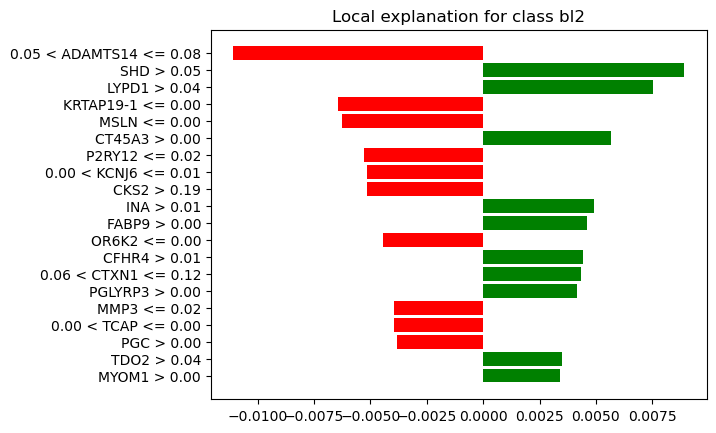

In [447]:
%matplotlib inline
fig = exp.as_pyplot_figure(label=1)

C:\Users\jomyf\anaconda3\Lib\site-packages\sklearn\base.py:439: UserWarning:

X does not have valid feature names, but RandomForestClassifier was fitted with feature names



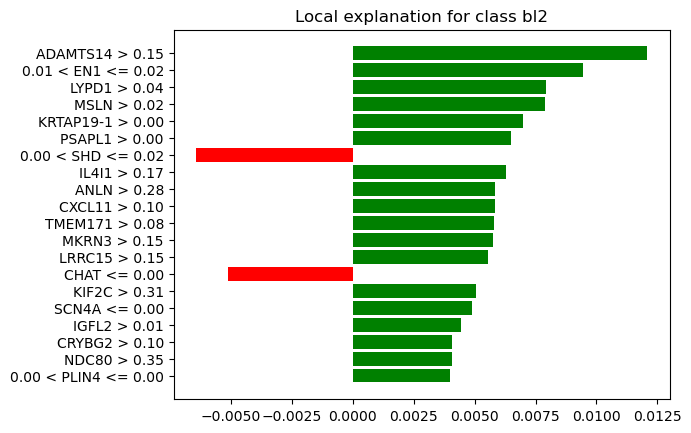

In [448]:
%matplotlib inline
exp = explainer.explain_instance(X_test.iloc[2,:],  best_model_rf.predict_proba, num_features=20)
fig = exp.as_pyplot_figure(label=1)

In [65]:
!pip install cufflinks

^C


In [355]:
import cufflinks as cf
cf.go_offline()
cf.set_config_file(offline=False, world_readable=True)

C:\Users\jomyf\anaconda3\Lib\site-packages\sklearn\base.py:439: UserWarning:

X does not have valid feature names, but RandomForestClassifier was fitted with feature names

C:\Users\jomyf\anaconda3\Lib\site-packages\sklearn\base.py:439: UserWarning:

X does not have valid feature names, but RandomForestClassifier was fitted with feature names

C:\Users\jomyf\anaconda3\Lib\site-packages\sklearn\base.py:439: UserWarning:

X does not have valid feature names, but RandomForestClassifier was fitted with feature names

C:\Users\jomyf\anaconda3\Lib\site-packages\sklearn\base.py:439: UserWarning:

X does not have valid feature names, but RandomForestClassifier was fitted with feature names

C:\Users\jomyf\anaconda3\Lib\site-packages\sklearn\base.py:439: UserWarning:

X does not have valid feature names, but RandomForestClassifier was fitted with feature names

C:\Users\jomyf\anaconda3\Lib\site-packages\sklearn\base.py:439: UserWarning:

X does not have valid feature names, but RandomForestClas

C:\Users\jomyf\anaconda3\Lib\site-packages\sklearn\base.py:439: UserWarning:

X does not have valid feature names, but RandomForestClassifier was fitted with feature names

C:\Users\jomyf\anaconda3\Lib\site-packages\sklearn\base.py:439: UserWarning:

X does not have valid feature names, but RandomForestClassifier was fitted with feature names

C:\Users\jomyf\anaconda3\Lib\site-packages\sklearn\base.py:439: UserWarning:

X does not have valid feature names, but RandomForestClassifier was fitted with feature names

C:\Users\jomyf\anaconda3\Lib\site-packages\sklearn\base.py:439: UserWarning:

X does not have valid feature names, but RandomForestClassifier was fitted with feature names

C:\Users\jomyf\anaconda3\Lib\site-packages\sklearn\base.py:439: UserWarning:

X does not have valid feature names, but RandomForestClassifier was fitted with feature names

C:\Users\jomyf\anaconda3\Lib\site-packages\sklearn\base.py:439: UserWarning:

X does not have valid feature names, but RandomForestClas

C:\Users\jomyf\anaconda3\Lib\site-packages\sklearn\base.py:439: UserWarning:

X does not have valid feature names, but RandomForestClassifier was fitted with feature names

C:\Users\jomyf\anaconda3\Lib\site-packages\sklearn\base.py:439: UserWarning:

X does not have valid feature names, but RandomForestClassifier was fitted with feature names

C:\Users\jomyf\anaconda3\Lib\site-packages\sklearn\base.py:439: UserWarning:

X does not have valid feature names, but RandomForestClassifier was fitted with feature names

C:\Users\jomyf\anaconda3\Lib\site-packages\sklearn\base.py:439: UserWarning:

X does not have valid feature names, but RandomForestClassifier was fitted with feature names

C:\Users\jomyf\anaconda3\Lib\site-packages\sklearn\base.py:439: UserWarning:

X does not have valid feature names, but RandomForestClassifier was fitted with feature names

C:\Users\jomyf\anaconda3\Lib\site-packages\sklearn\base.py:439: UserWarning:

X does not have valid feature names, but RandomForestClas

C:\Users\jomyf\anaconda3\Lib\site-packages\sklearn\base.py:439: UserWarning:

X does not have valid feature names, but RandomForestClassifier was fitted with feature names

C:\Users\jomyf\anaconda3\Lib\site-packages\sklearn\base.py:439: UserWarning:

X does not have valid feature names, but RandomForestClassifier was fitted with feature names

C:\Users\jomyf\anaconda3\Lib\site-packages\sklearn\base.py:439: UserWarning:

X does not have valid feature names, but RandomForestClassifier was fitted with feature names

C:\Users\jomyf\anaconda3\Lib\site-packages\sklearn\base.py:439: UserWarning:

X does not have valid feature names, but RandomForestClassifier was fitted with feature names

C:\Users\jomyf\anaconda3\Lib\site-packages\sklearn\base.py:439: UserWarning:

X does not have valid feature names, but RandomForestClassifier was fitted with feature names

C:\Users\jomyf\anaconda3\Lib\site-packages\sklearn\base.py:439: UserWarning:

X does not have valid feature names, but RandomForestClas

C:\Users\jomyf\anaconda3\Lib\site-packages\sklearn\base.py:439: UserWarning:

X does not have valid feature names, but RandomForestClassifier was fitted with feature names

C:\Users\jomyf\anaconda3\Lib\site-packages\sklearn\base.py:439: UserWarning:

X does not have valid feature names, but RandomForestClassifier was fitted with feature names

C:\Users\jomyf\anaconda3\Lib\site-packages\sklearn\base.py:439: UserWarning:

X does not have valid feature names, but RandomForestClassifier was fitted with feature names

C:\Users\jomyf\anaconda3\Lib\site-packages\sklearn\base.py:439: UserWarning:

X does not have valid feature names, but RandomForestClassifier was fitted with feature names

C:\Users\jomyf\anaconda3\Lib\site-packages\sklearn\base.py:439: UserWarning:

X does not have valid feature names, but RandomForestClassifier was fitted with feature names

C:\Users\jomyf\anaconda3\Lib\site-packages\sklearn\base.py:439: UserWarning:

X does not have valid feature names, but RandomForestClas

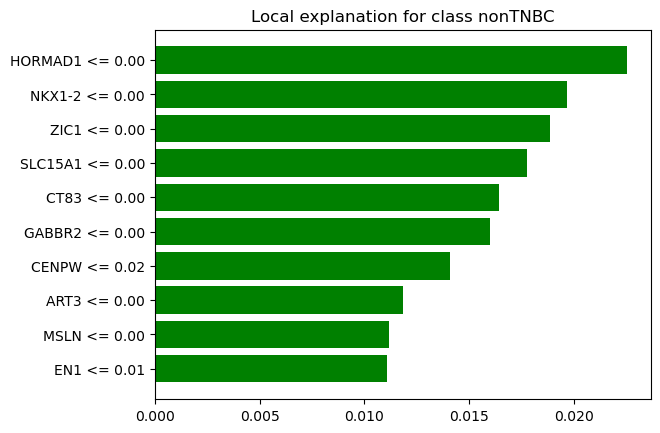

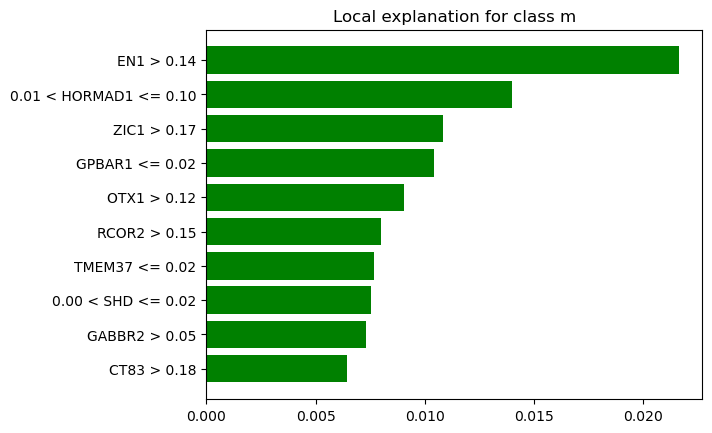

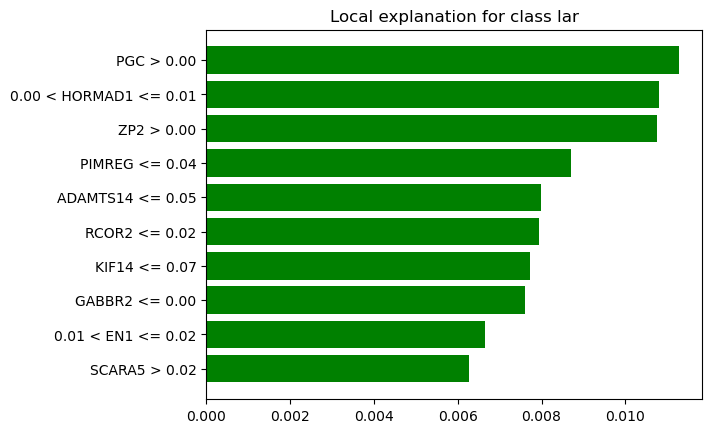

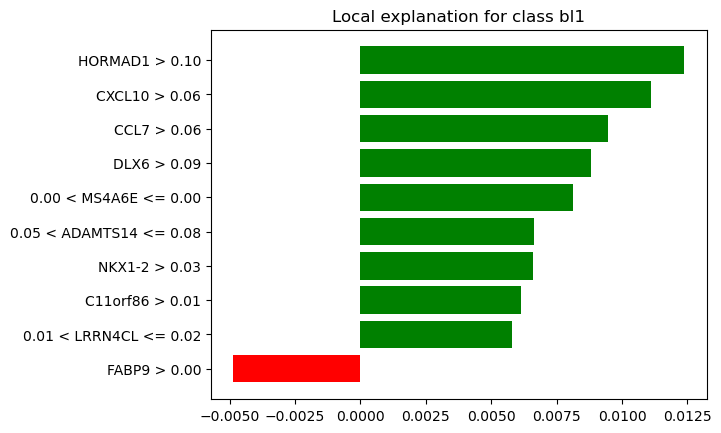

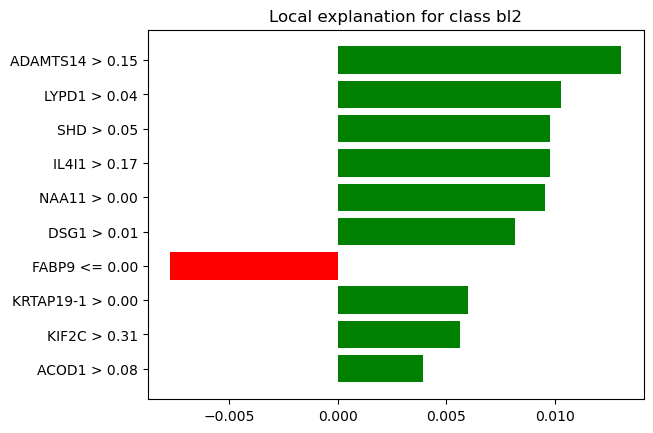

In [356]:
from lime import submodular_pick
sp_obj = submodular_pick.SubmodularPick(explainer, X_train.values, best_model_rf.predict_proba, sample_size=200, num_features=10, num_exps_desired=5)
#Plot the 5 explanations
[exp.as_pyplot_figure(label=exp.available_labels()[0]) for exp in sp_obj.sp_explanations];
# Make it into a dataframe
W_pick=pd.DataFrame([dict(this.as_list(this.available_labels()[0])) for this in sp_obj.sp_explanations]).fillna(0)
 
W_pick['prediction'] = [this.available_labels()[0] for this in sp_obj.sp_explanations]
 
#Making a dataframe of all the explanations of sampled points
W=pd.DataFrame([dict(this.as_list(this.available_labels()[0])) for this in sp_obj.explanations]).fillna(0)
W['prediction'] = [this.available_labels()[0] for this in sp_obj.explanations]
 
#Plotting the aggregate importances
np.abs(W.drop("prediction", axis=1)).mean(axis=0).sort_values(ascending=False).head(
    25
).sort_values(ascending=True).iplot(kind="barh")
 
#Aggregate importances split by classes
grped_coeff = W.groupby("prediction").mean()
 
grped_coeff = grped_coeff.T
grped_coeff["abs"] = np.abs(grped_coeff.iloc[:, 0])
grped_coeff.sort_values("abs", inplace=True, ascending=False)
grped_coeff.head(10).sort_values("abs", ascending=True).drop("abs", axis=1).iplot(
    kind="barh", bargap=0.5
) 


In [88]:
W_pick

,LACRT > 0.00,ZIC1 <= 0.00,CT83 <= 0.00,TMSB15A <= 0.01,KRTAP13-4 <= 0.00,PGC > 0.00,NKX1-2 <= 0.00,H1-1 <= 0.00,NPTX2 > 0.00,EN1 <= 0.01,...,MT1H > 0.00,SPIB > 0.01,HORMAD1 > 0.10,ART3 > 0.02,C11orf86 > 0.01,TPX2 > 0.22,FSD1 > 0.03,CXCL10 > 0.06,SH2D2A > 0.25,prediction
0,0.275288,0.151404,0.122259,0.102883,-0.09679,-0.090926,0.084802,0.07394,-0.050697,0.04706,...,0.000000,0.000000,0.000000,0.00000,0.00000,0.000000,0.000000,0.000000,0.000000,4
1,0.000000,0.000000,0.000000,0.000000,0.00000,0.000000,0.000000,0.00000,0.000000,0.00000,...,0.000000,0.000000,0.000000,0.00000,0.00000,0.000000,0.000000,0.000000,0.000000,1
2,0.000000,0.000000,0.000000,0.000000,0.00000,0.000000,0.000000,0.00000,0.000000,0.00000,...,0.000000,0.000000,0.000000,0.00000,0.00000,0.000000,0.000000,0.000000,0.000000,3
3,0.000000,0.000000,0.000000,0.000000,0.00000,0.000000,0.000000,0.00000,0.000000,0.00000,...,0.000000,0.000000,0.000000,0.00000,0.00000,0.000000,0.000000,0.000000,0.000000,2
4,0.000000,0.000000,0.000000,0.000000,0.00000,0.000000,0.000000,0.00000,0.000000,0.00000,...,0.132897,0.122376,0.120487,0.11106,0.10558,0.068399,0.068022,0.057274,0.048496,0


In [89]:
x=np.abs(W.drop("prediction", axis=1)).mean(axis=0).sort_values(ascending=False).head(25).sort_values(ascending=True)
x

VGLL2 > 0.00          0.010908
MDGA2 > 0.18          0.011892
0.00 < PGC <= 0.00    0.011938
CASQ1 > 0.00          0.012710
NPR1 > 0.05           0.013174
AMPD1 > 0.00          0.014434
CHAT <= 0.00          0.014462
H1-1 <= 0.00          0.015173
RCOR2 > 0.15          0.016437
APCS <= 0.00          0.017529
NKX1-2 <= 0.00        0.017841
TMSB15A <= 0.01       0.018764
ADAMTS14 > 0.15       0.019030
NMU > 0.01            0.019494
NPTX2 > 0.00          0.022032
ROS1 > 0.02           0.023057
LYPD1 > 0.04          0.023598
KRT6A > 0.00          0.024941
FABP9 > 0.00          0.025137
ZP2 > 0.00            0.025244
KRTAP13-4 <= 0.00     0.025837
CT83 <= 0.00          0.029713
ZIC1 <= 0.00          0.033196
LACRT > 0.00          0.051645
PGC > 0.00            0.060460
dtype: float64

In [90]:
#Aggregate importances split by classes
grped_coeff = W.groupby("prediction").mean()
 
grped_coeff = grped_coeff.T
grped_coeff["abs"] = np.abs(grped_coeff.iloc[:, 0])
grped_coeff.sort_values("abs", inplace=True, ascending=False)
grped_coeff.head(25).sort_values("abs", ascending=True).drop("abs", axis=1).iplot(
    kind="barh", bargap=0.5
) 

In [ ]:
#Plotting the aggregate importances
np.abs(W.drop("prediction", axis=1)).mean(axis=0).sort_values(ascending=False).head(
    25
).sort_values(ascending=True).iplot(kind="barh")

In [ ]:
# Plotting the aggregate importances
fig, ax = plt.subplots()
np.abs(W.drop("prediction", axis=1)).mean(axis=0).sort_values(ascending=False).head(25).sort_values(ascending=True).plot(kind="barh", ax=ax)
ax.set_title('LIME Aggregate Feature Importances')
plt.show()



In [1]:
grped_coeff = W.groupby("prediction").mean()
print(grped_coeff)

NameError: name 'W' is not defined

# **SHAP**

In [96]:
pip install shap

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 540.1/540.1 kB 3.6 MB/s eta 0:00:00


In [38]:
# Gradient Boosting Classifier

best_model_rf = RandomForestClassifier()  # Replace with the best model
best_model_rf.fit(X_train, y_train)
scores_rf = cross_val_score(best_model_rf, X_train, y_train, cv=10)
print(f'Cross-Validation Scores: {scores_rf}')
print(f'Mean Cross-Validation Score: {np.mean(scores_rf)}')

Cross-Validation Scores: [0.96590909 0.96590909 0.97727273 0.95402299 0.97701149 0.96551724
 0.95402299 0.98850575 0.97701149 1.        ]
Mean Cross-Validation Score: 0.9725182863113897


In [164]:
# Get shap values

import shap
shap.initjs()

explainer_shap = shap.TreeExplainer(best_model_rf,) # best_gbc.predict_proba
shap_values = explainer_shap(X_test) #, check_additivity = False

# This step may take a long time to run so a subset can be used

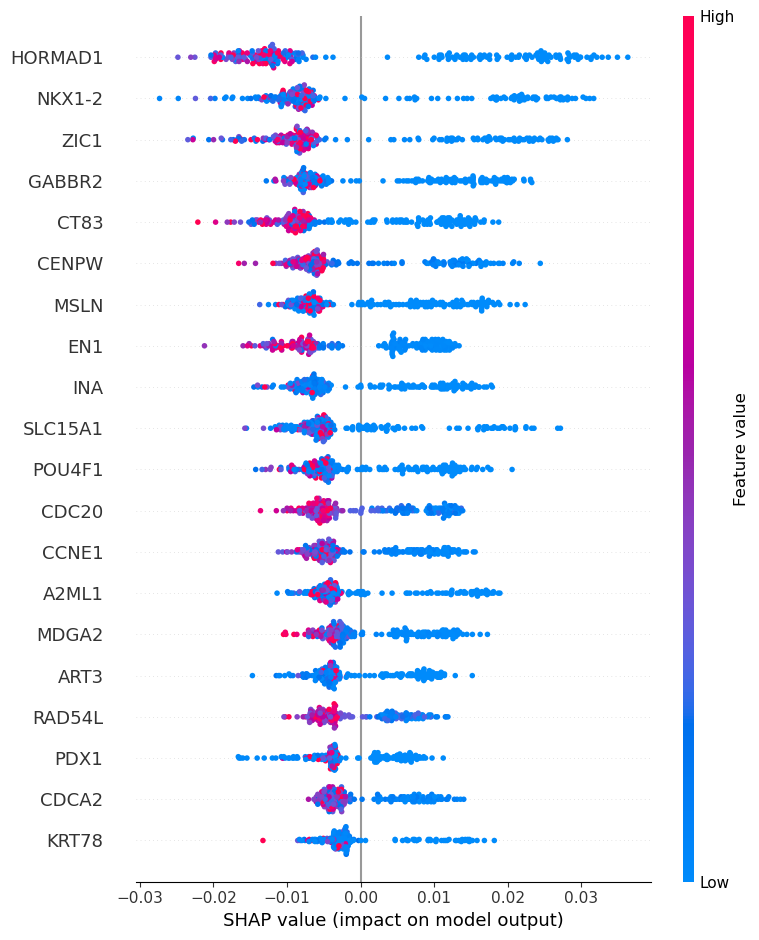

In [40]:
shap.summary_plot(shap_values[:,:,-1], X_test)

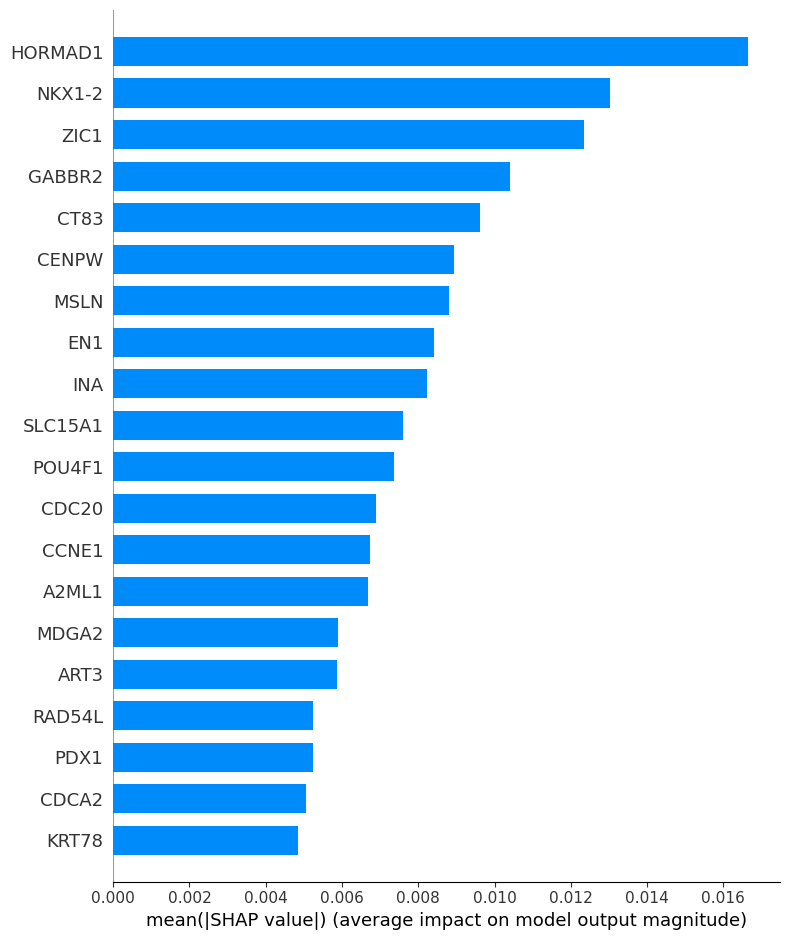

In [41]:
shap.summary_plot(shap_values[:,:,-1], X_test.values, plot_type="bar", class_names= class_names, feature_names = X_test.columns[:])

In [42]:
shap_values.shape

(219, 961, 5)

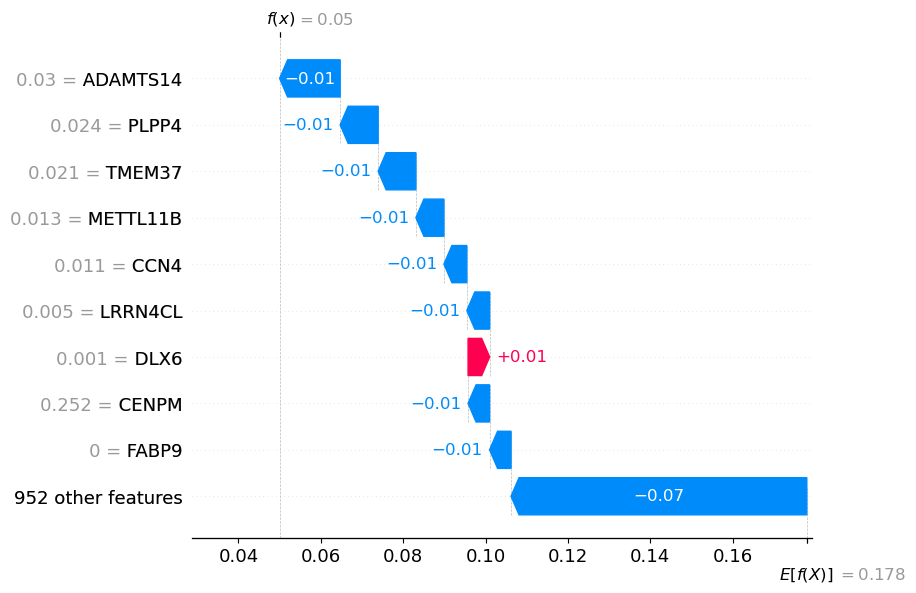

In [43]:
# Waterfall plot

shap.plots.waterfall(shap_values[0,:,1])

# Ef(x) = average prediction accross all observations, f(x) =  prediction for this particlar obs
# shap values tell us how each model feature has contributed to the difference between the prediction and average prediction
# Example - TFF1 gene has decreased the prediction by -2.01

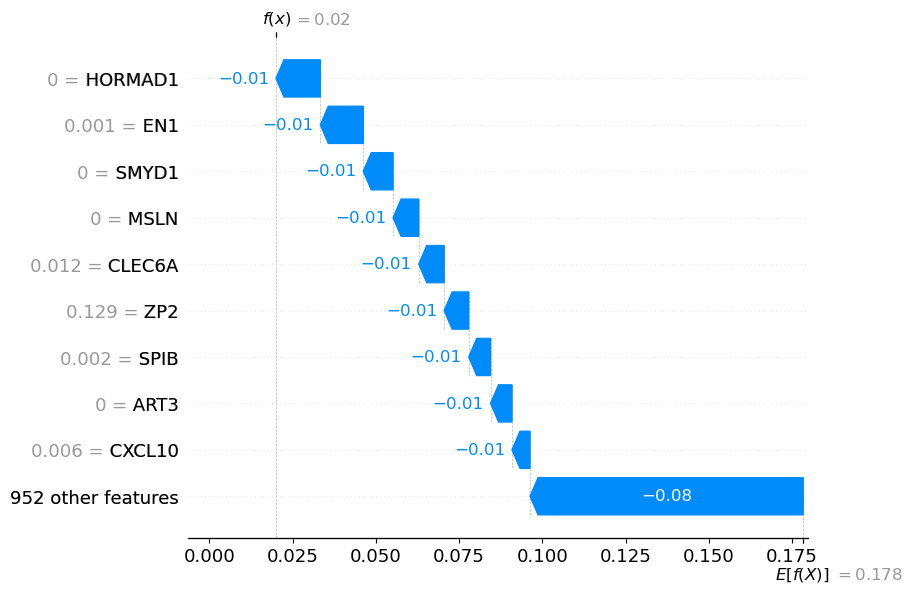

In [44]:
shap.plots.waterfall(shap_values[1,:,0])

In [45]:
explainer_shap.expected_value

array([0.17833906, 0.17800687, 0.19411226, 0.19075601, 0.2587858 ])

In [46]:
X_test.iloc[0, :]

HSPB6         0.000317
PDK4          0.001531
ABCB5         0.000533
SLC4A1        0.003458
TMEM132A      0.155097
                ...   
AC012213.5    0.000000
H3C2          0.000426
H3C3          0.008012
AC106741.1    0.000000
NPBWR1        0.001633
Name: 482, Length: 961, dtype: float64

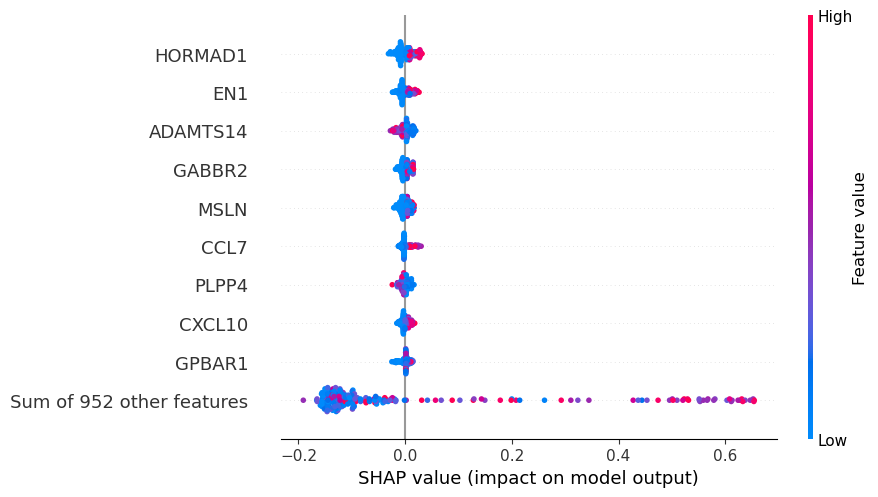

In [47]:
# Beeswarm Plot

shap.plots.beeswarm(shap_values[:,:,0]) # Position can be altered

# As feature values increase, shap values also increase

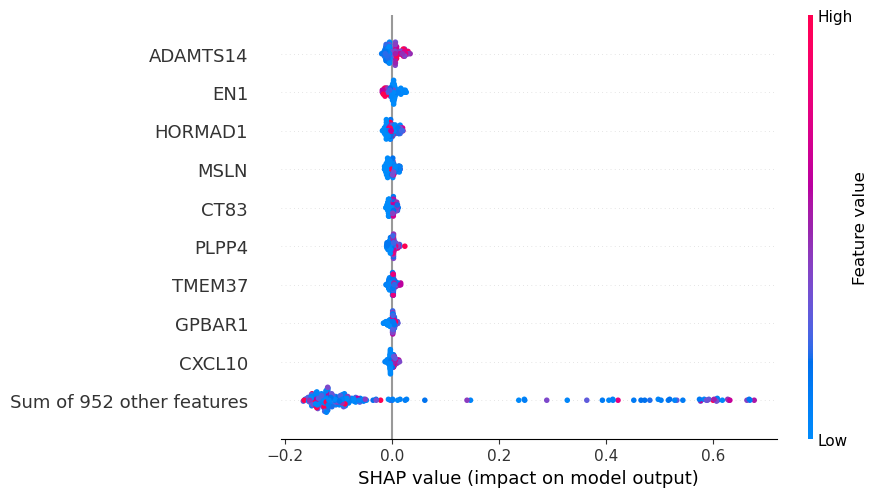

In [48]:
shap.plots.beeswarm(shap_values[:,:,1])

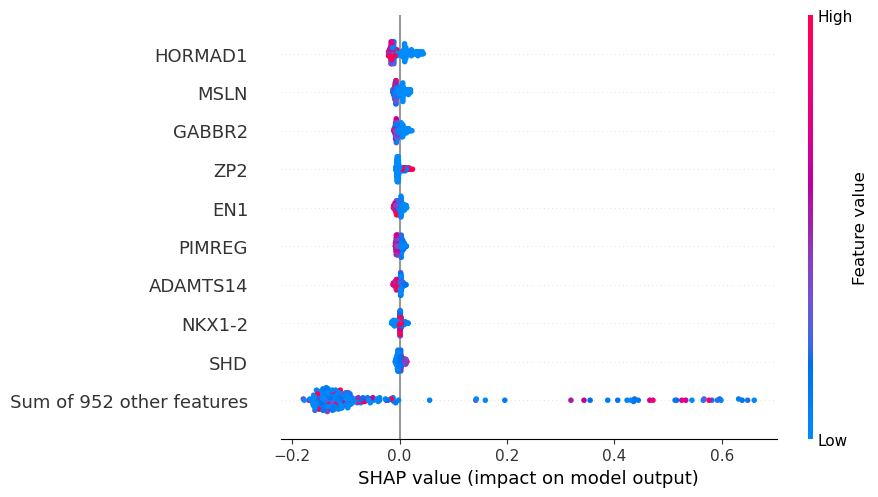

In [49]:
shap.plots.beeswarm(shap_values[:,:,2])

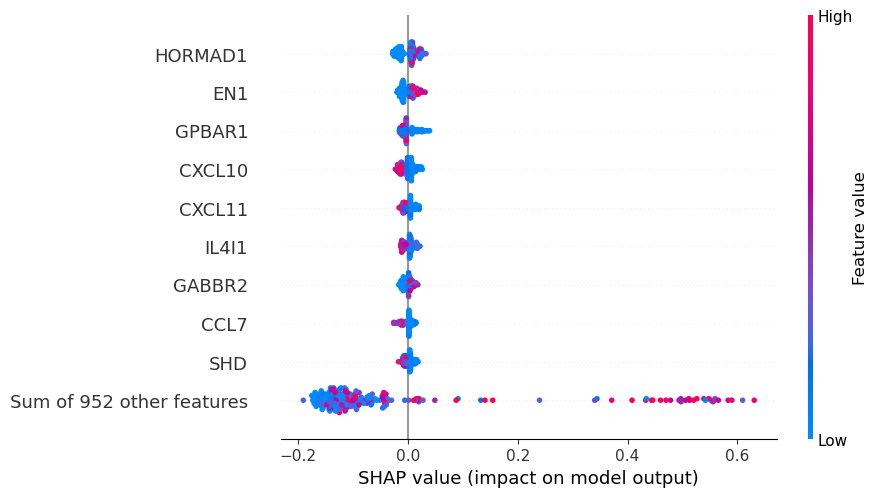

In [50]:
shap.plots.beeswarm(shap_values[:,:,3])

In [51]:
y_test[0]

'bl1'

In [52]:
model.classes_

array(['bl1', 'bl2', 'lar', 'm', 'nonTNBC'], dtype='<U7')

In [58]:
shap.plots.force(shap_values[0,:,0])

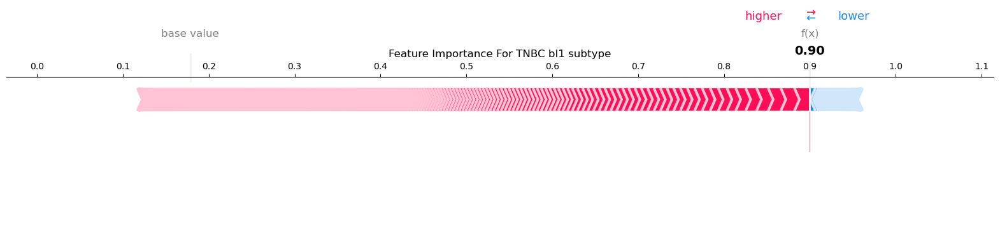

In [54]:
# Force Plot - condensed waterfall plot

shap.initjs()

shap.plots.force(shap_values[0,:,0],matplotlib=True, show=False)
plt.title("Feature Importance For TNBC bl1 subtype")
plt.show()

In [55]:
y_test[2]

'bl2'

In [56]:
shap.plots.force(shap_values[2,:,1])

In [269]:
y_test[15]

'm'

In [268]:
shap.plots.force(shap_values[15,:,3])

In [519]:
y_test[185]

'm'

In [520]:
shap.plots.force(shap_values[185,:,3])

In [290]:
y_test[32]

'lar'

In [291]:
shap.plots.force(shap_values[32,:,2])

In [286]:
y_test[22]

'lar'

In [278]:
shap.plots.force(shap_values[22,:,2])

In [525]:
y_test[54]

'lar'

In [526]:
shap.plots.force(shap_values[54,:,2])

In [120]:
X_test.iloc[1, :]

HSPB6         0.001187
PDK4          0.001553
ABCB5         0.005712
SLC4A1        0.024532
TMEM132A      0.151809
                ...   
AC012213.5    0.127182
H3C2          0.001421
H3C3          0.000741
AC106741.1    0.149171
NPBWR1        0.013211
Name: 139, Length: 961, dtype: float64

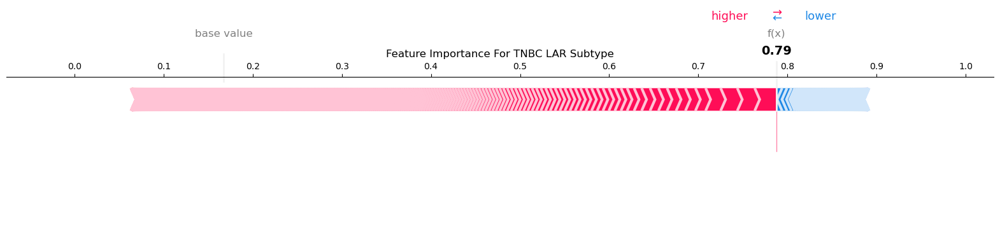

In [128]:
shap.plots.force(explainer.expected_value[0],shap_values[8,:,3],X_test.iloc[1, :],matplotlib=True, show=False)
plt.title("Feature Importance For TNBC LAR Subtype")
plt.show()

In [121]:
y_test[3]

'lar'

In [59]:
shap.plots.force(shap_values[3,:,2])

In [60]:
y_test[6]

'nonTNBC'

In [124]:
X_test.iloc[1, :]

INO80C     0.415873
CA4        0.000150
FKBP7      0.532348
CAPN13     0.002452
CELF4      0.016756
             ...   
ZCCHC14    0.355244
ZNF224     0.146433
S100A10    0.261400
MERTK      0.116902
EPHA8      0.094225
Name: 667, Length: 740, dtype: float64

In [61]:
shap.plots.force(shap_values[6,:,4])

In [167]:
y_test[17]

'bl1'

In [168]:
shap.plots.force(shap_values[17,:,0])

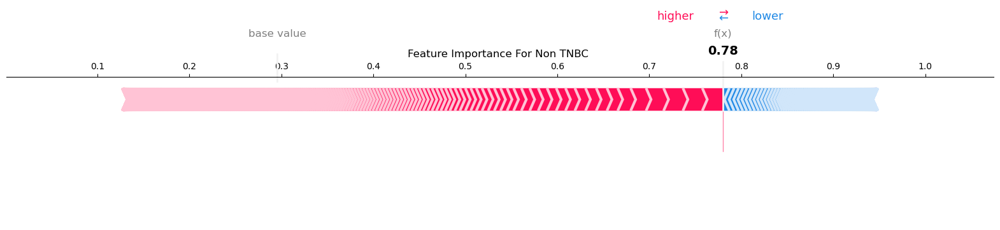

In [151]:
shap.plots.force(explainer.expected_value[4],shap_values[6,:,4],X_test.iloc[1, :],matplotlib=True, show=False)
plt.title("Feature Importance For Non TNBC ")
plt.show()

In [105]:
y_test[19]

'bl2'

In [106]:
shap.plots.force(shap_values[19,:,1])

In [511]:
y_test[9]

'lar'

In [66]:
shap.plots.force(shap_values[8,:,3])

In [176]:
y_test[10]

'lar'

In [513]:
shap.plots.force(shap_values[10,:,2])

In [509]:
shap.plots.force(explainer.expected_value[4],shap_values[93,:,4],X_test.iloc[1, :],matplotlib=True, show=False)
plt.title("Feature Importance For TNBC M Subtype")
plt.show()

AttributeError: 'LimeTabularExplainer' object has no attribute 'expected_value'

In [108]:
shap.initjs()
explainer = shap.Explainer(best_model_rf, X_train)
shap_values = explainer.shap_values(X_test, check_additivity=False)

In [117]:
y_test[41]

'm'

In [170]:
shap.plots.force(explainer.expected_value[3], shap_values[41,:,3], X_test.iloc[9, :],matplotlib=True, show=False)
plt.title("Feature Importance For LAR")
plt.show()

AttributeError: 'LimeTabularExplainer' object has no attribute 'expected_value'

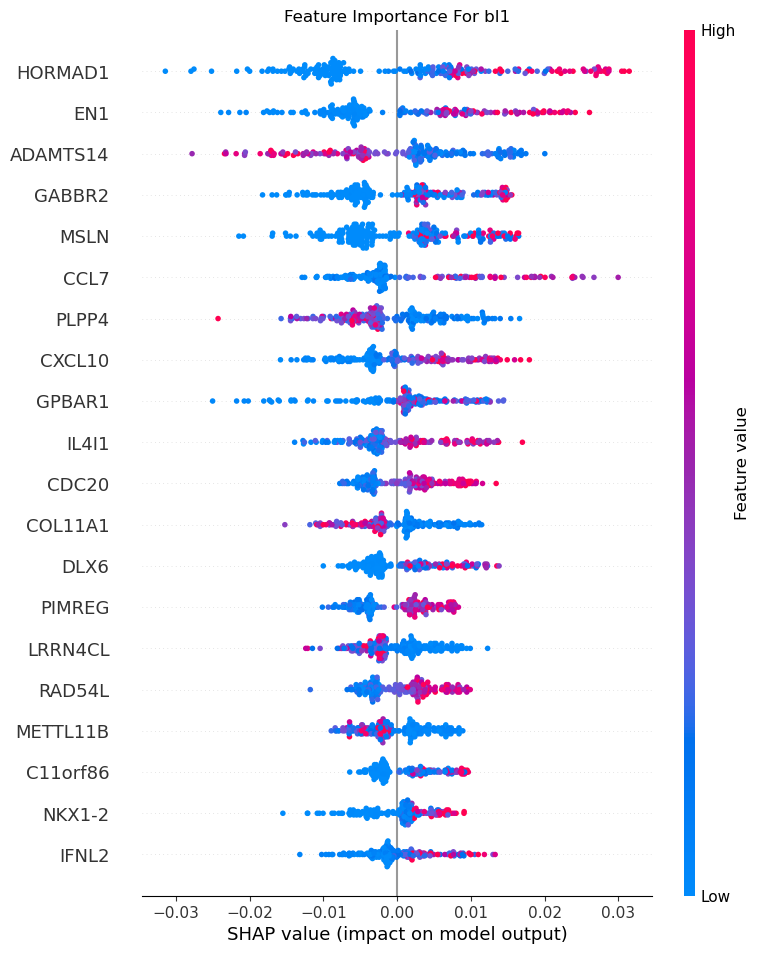

In [91]:
# Summarize the effects of features for class 1
shap.summary_plot(shap_values[:, :, 0], X_test,show=False)
plt.title("Feature Importance For bl1")
plt.show()

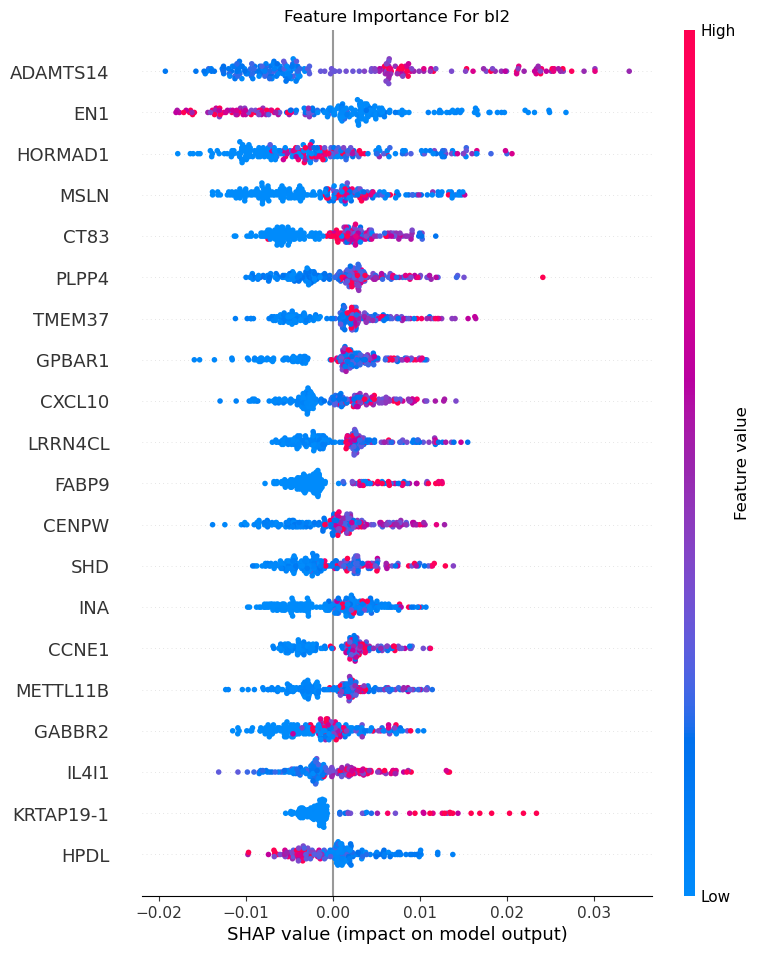

In [92]:
# Summarize the effects of features for class 1
shap.summary_plot(shap_values[:, :, 1], X_test,show=False)
plt.title("Feature Importance For bl2")
plt.show()

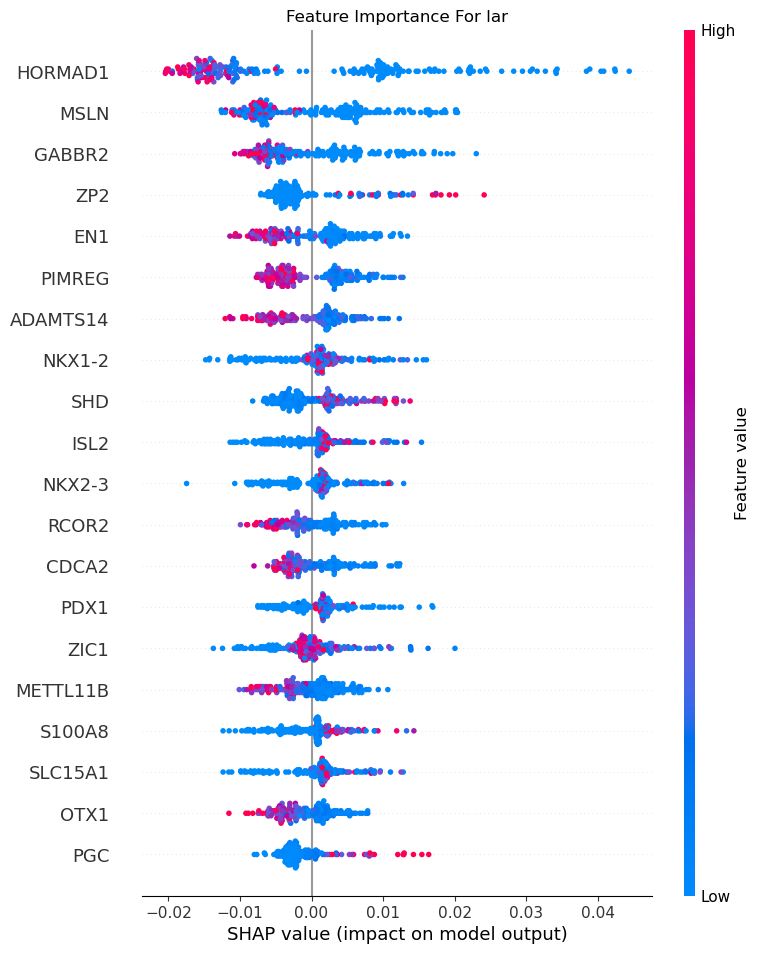

In [102]:
# Summarize the effects of features for class 1
shap.summary_plot(shap_values[:, :, 2], X_test,show=False)
plt.title("Feature Importance For lar")
plt.show()

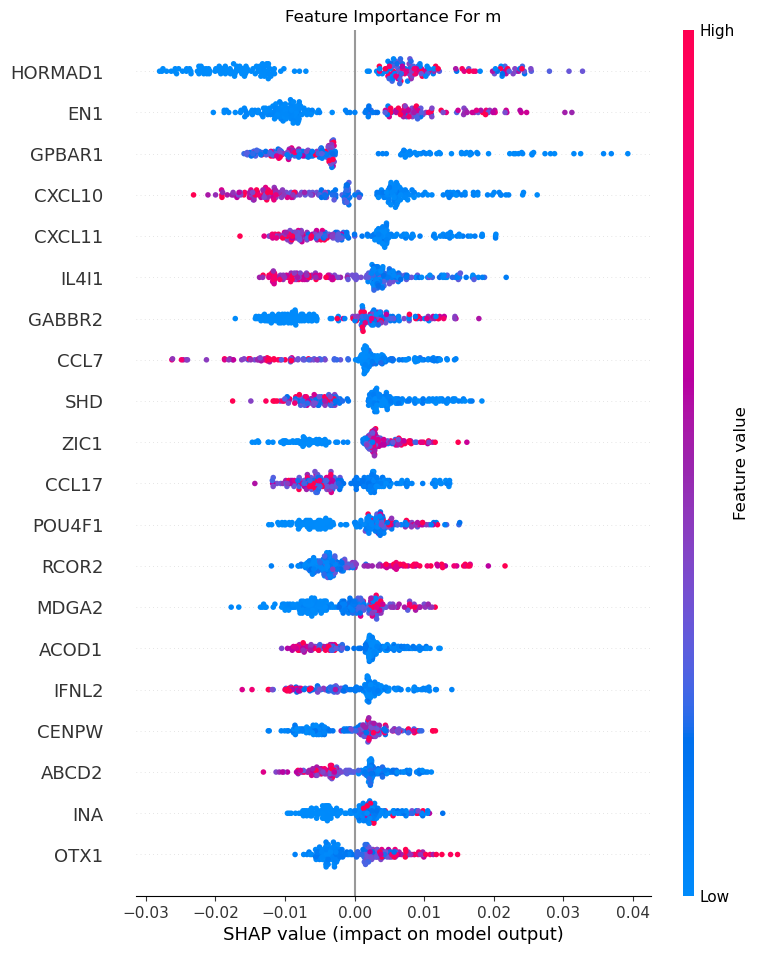

In [527]:
# Summarize the effects of features for class 1
shap.summary_plot(shap_values[:, :, 3], X_test,show=False)
plt.title("Feature Importance For m")
plt.show()